# The goal of this assignment is to explore and cluster the neighborhoods in Casablanca

# I-  Getting and Cleaning Data

First, we need to import all the dependency needed to acheive this project

In [1]:
import numpy as np # import the numpy library to handle data in a vectorized manner
import pandas as pd #import pandas to scrap the table from wikipedia, pre-process it and store it in a dataframe
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', None)
# !conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests  # library to handle requests
import geocoder

import folium # map rendering library

from sklearn.cluster import KMeans

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

The 1st part of any data project is Data aquisition and wrangling.  
In this project, I needed to get the following data 
- The names and postal codes of all neighberhoods in the city of Casablanca;
- The coordinates of each neighberhoods in Casablanca;
- Venues data for each neighberhoods in Casablanca.

## 1- Neighberhoods data aquisition 

The data on postal codes in Casablanca is obtained from [The postal service of morroco](http://www.codepostal.ma/search_mot.aspx?keyword=CASABLANCA).  
In order to prepare the dataset for modeling, we need first to scrap it and store it in a pandas dataframe.
In order to scrap the data from the webpage tables we will use the `.read_html()` pandas method.  
so lets try it and see how many tables we scrap the data`

In [2]:
#store the as in an object
url = 'http://www.codepostal.ma/search_mot.aspx?keyword=CASABLANCA'
#read all the table in the webpage and store them in an object
tables = pd.read_html(url)
#get the number of tables in the webpage
print('the number of tables in the webpage is:')
print(len(tables))

the number of tables in the webpage is:
10


The webpage contains 10 tables. The tables that contains all the neighberhoods in Casablanca is table 5 shown below.

In [3]:
tables[5]

,0,1,2
0,Ville,Quartier/Voie,Code postal
1,CASABLANCA,4 EME TRANCHE,20450
2,CASABLANCA,6 EME TRANCHE,20450
3,CASABLANCA,AABIR,20400
4,CASABLANCA,AAHD AL JADID,20450
5,CASABLANCA,ABATTOIRES,20320
6,CASABLANCA,ABOUAB NASSIM,20190
7,CASABLANCA,ABOUAB OUM RABII,20220
8,CASABLANCA,ABRAJ ABDELMOUMEN,20340
9,CASABLANCA,ABRAJ EL FIDA,20530


We then stored the table in a dataframe with its 1st row as the header

In [4]:
Casablanca_neigh = tables[5]
Casablanca_neigh.columns = Casablanca_neigh.iloc[0]
Casablanca_neigh = Casablanca_neigh[1:]

In [5]:
Casablanca_neigh.head()

,Ville,Quartier/Voie,Code postal
1,CASABLANCA,4 EME TRANCHE,20450
2,CASABLANCA,6 EME TRANCHE,20450
3,CASABLANCA,AABIR,20400
4,CASABLANCA,AAHD AL JADID,20450
5,CASABLANCA,ABATTOIRES,20320


Before we can continue, let's check if we have data from other cities

In [6]:
Casablanca_neigh['Ville'].value_counts()

CASABLANCA    3048
Name: Ville, dtype: int64

Great!  
Now we need to drop the 1st colum that indicate the city. the colums is redendent.

In [7]:
Casablanca_neighborhoods = Casablanca_neigh.drop(['Ville'], axis=1)

Let's check the dataframe shape

In [8]:
Casablanca_neighborhoods.head()

,Quartier/Voie,Code postal
1,4 EME TRANCHE,20450
2,6 EME TRANCHE,20450
3,AABIR,20400
4,AAHD AL JADID,20450
5,ABATTOIRES,20320


In [9]:
Casablanca_neighborhoods.shape

(3048, 2)

We have a data frame with 2 columns and 3048 rows. Casablanca is indeed a big city!  
Lets also translate the column names to english

In [10]:
Casablanca_neighborhoods = Casablanca_neighborhoods.rename(columns={"Quartier/Voie": "neighborhood", "Code postal": "postalcode"})

Next, I checked the dataframe for null values and changed its name

In [11]:
Casablanca_neighborhoods.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3048 entries, 1 to 3048
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   neighborhood  3048 non-null   object
 1   postalcode    3048 non-null   object
dtypes: object(2)
memory usage: 47.8+ KB


In [12]:
post_df = pd.DataFrame(data = Casablanca_neighborhoods, columns=['neighborhood','postalcode'])
post_df.head()

,neighborhood,postalcode
1,4 EME TRANCHE,20450
2,6 EME TRANCHE,20450
3,AABIR,20400
4,AAHD AL JADID,20450
5,ABATTOIRES,20320


Cool! our dataframe is ready. Well, half of it. We still need to get the coordinates for each neighberhood

## 2. Adding the coordinates data to our dataframe

This was chalenging. After trying to use Google geocoder in vain, *The loop took a very long time, i tried for 12h+ and didnt succes*, i used **ArcGIS** geocoder to extract the neighberhoods coordinates.  
The method documentation : https://geocoder.readthedocs.io/providers/ArcGIS.html

*All the credit for this section goes to **Lim Chia Hooi**.*
- His github account: https://github.com/limchiahooi
- The notebook where i found the code: https://github.com/limchiahooi/Coursera_Capstone/blob/master/week5_final_report.ipynb

First we need to create a function to get every neighberhood coordinate.

In [13]:
def get_latlng(neighborhood):
    # initialize your variable to None
    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Casablanca, MAR'.format(neighborhood))
        lat_lng_coords = g.latlng
    return lat_lng_coords

Second, we called the function to get the coordinates, store in a new list using list comprehension.

In [14]:
# coords = [ get_latlng(neighborhood) for neighborhood in post_df["neighborhood"].tolist() ]

In [15]:
# coords

Third, create temporary dataframe to populate the coordinates into Latitude and Longitude, then merge the coordinates into the original dataframe.

In [16]:
# df_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])
# merge the coordinates into the original dataframe
# post_df['Latitude'] = df_coords['Latitude']
# post_df['Longitude'] = df_coords['Longitude']

Then checking the populated dataframe and save it in a csv file to avoid repreating the time consumming loop that we used to get the coordinates.

In [17]:
# check the neighborhoods and the coordinates
# print(post_df.shape)
# post_df

In [18]:
# save the DataFrame as CSV file
# post_df.to_csv("Casablanca_data.csv", index=False)

In [19]:
Casablanca_df = pd.read_csv("Casablanca_data.csv") 
Casablanca_df.tail()

,neighborhood,postalcode,Latitude,Longitude
3043,ZONE INDUSTRIEL POLYGONE,20590,33.62689,-7.51374
3044,ZONE INDUSTRIELLE BEN M'SICK,20660,33.62689,-7.51374
3045,ZONE INDUSTRIELLE LISSASFA,20190,33.62689,-7.51374
3046,ZONE INDUSTRIELLE SIDI MAAROUF,20280,33.59661,-7.61889
3047,ZOUBIR,20260,NaN,NaN


Before we finish, lets check the dataframe for null values

In [20]:
Casablanca_df.isnull().sum().sum()

2

Two missing values out of 3048 rows. We can work with that. the Nan values could be assosited with one neigherhood (both the lat and long values are missing) or with two separqted neighberhoods.  
Lets check both columns.

In [21]:
bool_series_lat = pd.isnull(Casablanca_df['Latitude'])
Casablanca_df[bool_series_lat]

,neighborhood,postalcode,Latitude,Longitude
3047,ZOUBIR,20260,NaN,NaN


Nevermind, its only one neighberhoods. we can simply find its coordinates manually.

The coordinates for 'quartier zoubir' are missing.  
We could get the coordinates using Google maps via the link:
https://www.google.com/maps/place/Quartier+Zoubair,+Casablanca/@33.5406389,-7.6872593,17z/data=!3m1!4b1!4m8!1m2!2m1!1squartier+zoubir+casablanca!3m4!1s0xda62cbc850601f1:0x4120cb8aefac8128!8m2!3d33.5405041!4d-7.6853352  
The coordinates are:  
33.5406389, -7.6872593

Let's drop the null row and enter the valid data points

In [22]:
Casablanca_df = Casablanca_df.dropna()

In [23]:
zoubir_df = pd.DataFrame(data=[['QUARTIER ZOUBIR', '20260','33.5406389','-7.6872593']], columns=['neighborhood','postalcode','Latitude','Longitude'])
zoubir_df.head()

,neighborhood,postalcode,Latitude,Longitude
0,QUARTIER ZOUBIR,20260,33.5406389,-7.6872593


In [24]:
Casablanca_df = Casablanca_df.append(zoubir_df)

In [25]:
Casablanca_df.reset_index()

,index,neighborhood,postalcode,Latitude,Longitude
0,0,4 EME TRANCHE,20450,33.5566,-7.58045
1,1,6 EME TRANCHE,20450,33.5966,-7.61889
2,2,AABIR,20400,33.5523,-7.57931
3,3,AAHD AL JADID,20450,33.5695,-7.62451
4,4,ABATTOIRES,20320,33.5942,-7.55473
5,5,ABOUAB NASSIM,20190,33.5838,-7.61464
6,6,ABOUAB OUM RABII,20220,33.5782,-7.60302
7,7,ABRAJ ABDELMOUMEN,20340,33.5763,-7.59954
8,8,ABRAJ EL FIDA,20530,33.5381,-7.60318
9,9,ADDAMANE,20460,33.5931,-7.66055


In [26]:
Casablanca_df = pd.DataFrame(data = Casablanca_df, columns=['neighborhood','postalcode','Latitude','Longitude'])
Casablanca_df.head()

,neighborhood,postalcode,Latitude,Longitude
0,4 EME TRANCHE,20450,33.5566,-7.58045
1,6 EME TRANCHE,20450,33.5966,-7.61889
2,AABIR,20400,33.5523,-7.57931
3,AAHD AL JADID,20450,33.5695,-7.62451
4,ABATTOIRES,20320,33.5942,-7.55473


In [27]:
Casablanca_df.isnull().sum().sum()

0

In [28]:
Casablanca_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3048 entries, 0 to 0
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   neighborhood  3048 non-null   object
 1   postalcode    3048 non-null   object
 2   Latitude      3048 non-null   object
 3   Longitude     3048 non-null   object
dtypes: object(4)
memory usage: 119.1+ KB


Ta-Daaaa!!

## 3. Removing duplicate data points

In [29]:
#Drop duplicate neighberhoods
Casablanca_df1 = Casablanca_df.drop_duplicates(subset=['neighborhood'])
Casablanca_df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2981 entries, 0 to 0
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   neighborhood  2981 non-null   object
 1   postalcode    2981 non-null   object
 2   Latitude      2981 non-null   object
 3   Longitude     2981 non-null   object
dtypes: object(4)
memory usage: 116.4+ KB


In [30]:
Casablanca_df2 = Casablanca_df1.drop_duplicates(subset=['Latitude','Longitude'])
Casablanca_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1038 entries, 0 to 0
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   neighborhood  1038 non-null   object
 1   postalcode    1038 non-null   object
 2   Latitude      1038 non-null   object
 3   Longitude     1038 non-null   object
dtypes: object(4)
memory usage: 40.5+ KB


## 4.Exploring Casablanca and verifying data usability 

In [31]:
address = 'Casablanca, MA'
geolocator = Nominatim(user_agent="casa_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Casablanca are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Casablanca are 33.5950627, -7.6187768.


In [32]:
map_casa = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(Casablanca_df2['Latitude'],Casablanca_df2['Longitude'], Casablanca_df2['neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_casa)  
    
map_casa

Data is not reliable. 
We should only take into account neighberhoods in **Prefecture of Casablanca**. 
To do so we needs to get the coordinates of the  city's administrative polygon boundary.
This is done by following these steps 
1. use openstreetmap https://nominatim.openstreetmap.org/ to search for the city 
2. Get the city detqils https://nominatim.openstreetmap.org/ui/details.html?osmtype=R&osmid=2523504&class=boundary
3. Copy the OSM ID. 2523504
4. use http://polygons.openstreetmap.fr/index.py to search for the polygone using the OSM ID.
5. Get the polygone from: http://polygons.openstreetmap.fr/index.py?id=2523504
6. profit!

*All the credit for the method to get the polygone goes to https://gis.stackexchange.com/a/192298*

## 5. Getting Venues information

In the second part of our analysis, W'll use the Foursquare API to get venues information

In [33]:
CLIENT_ID = 'D31DJRLJKAVJ5ADUXR22BTH3PJGRG02QUU4WTOTVT54K11KM' # your Foursquare ID
CLIENT_SECRET = 'OVUOOIRZ4SNVJJY2ACLY5WKHDWBETOL4HBGK5HI3I2EAWDDI' # your Foursquare Secret
ACCESS_TOKEN = 'PLLDZVZHWCIWYFI3QHIC12M5DJU4T4OJM2YXCK4GMS1TOTJW'
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: D31DJRLJKAVJ5ADUXR22BTH3PJGRG02QUU4WTOTVT54K11KM
CLIENT_SECRET:OVUOOIRZ4SNVJJY2ACLY5WKHDWBETOL4HBGK5HI3I2EAWDDI


In [34]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    LIMIT=100
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)            
        # make the GET request
        while True:
            try:
                results = requests.get(url).json()["response"]['groups'][0]['items']
                break
            except:
                continue        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']    
    return(nearby_venues)

In [35]:
import requests  # library to handle requests
#commented out 
# Casa_venues = getNearbyVenues(names=Casablanca_df2['neighborhood'],
#                                   latitudes=Casablanca_df2['Latitude'],
#                                   longitudes=Casablanca_df2['Longitude'],
#                                  )

In [36]:
# Casa_venues.to_csv("Casa_venues_V1-1.csv", index=False)

In [37]:
Casa_venues = pd.read_csv(r'C:\Users\serab\Casa_venues_V1-1.csv') 
Casa_venues.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7995 entries, 0 to 7994
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Neighborhood             7995 non-null   object 
 1   Neighbourhood Latitude   7995 non-null   float64
 2   Neighbourhood Longitude  7995 non-null   float64
 3   Venue                    7995 non-null   object 
 4   Venue Latitude           7995 non-null   float64
 5   Venue Longitude          7995 non-null   float64
 6   Venue Category           7995 non-null   object 
dtypes: float64(4), object(3)
memory usage: 437.4+ KB


In [38]:
print(Casa_venues.shape)
Casa_venues.head()

(7995, 7)


,Neighborhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,4 EME TRANCHE,33.55659,-7.58045,Cafe Akwas,33.555900,-7.584277,Café
1,4 EME TRANCHE,33.55659,-7.58045,Pneumatiques,33.554424,-7.584512,Astrologer
2,4 EME TRANCHE,33.55659,-7.58045,Al Kimma,33.557927,-7.585251,Café
3,6 EME TRANCHE,33.59661,-7.61889,Six PM,33.595940,-7.618684,Hotel Bar
4,6 EME TRANCHE,33.59661,-7.61889,Hyatt Regency Casablanca,33.596195,-7.618708,Hotel


In [39]:
Casa_venues.groupby('Neighborhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
4 EME TRANCHE,3,3,3,3,3,3
6 EME TRANCHE,49,49,49,49,49,49
AABIR,3,3,3,3,3,3
AAHD AL JADID,5,5,5,5,5,5
ABATTOIRES,2,2,2,2,2,2
ABOUAB NASSIM,15,15,15,15,15,15
ABOUAB OUM RABII,8,8,8,8,8,8
ABRAJ ABDELMOUMEN,5,5,5,5,5,5
ABRAJ EL FIDA,5,5,5,5,5,5


In [40]:
# II- Modelling print('There are {} uniques categories.'.format(len(Casa_venues['Venue Category'].unique())))

# II- Modelling 

## 1. Feature engeneering

In order to apply the clustering algorithm to our dataset, we should prepare it for modeling using one hot encoding

In [41]:
# one hot encoding
Casa_onehot = pd.get_dummies(Casa_venues[['Venue Category']], prefix="", prefix_sep="")

In [42]:
# add neighborhood column back to dataframe
Casa_onehot['Neighborhood'] = Casa_venues['Neighborhood']

In [43]:
# move neighborhood column to the first column
fixed_columns = [Casa_onehot.columns[-1]] + list(Casa_onehot.columns[:-1])
Casa_onehot = Casa_onehot[fixed_columns]

Casa_onehot.head()

,Zoo Exhibit,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Art Gallery,Arts & Entertainment,Asian Restaurant,Astrologer,Athletics & Sports,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Beer Garden,Big Box Store,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Brazilian Restaurant,Breakfast Spot,Burger Joint,Burrito Place,Bus Station,Cafeteria,Café,Camera Store,Caribbean Restaurant,Carpet Store,Chinese Restaurant,Circus,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cruise Ship,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Duty-free Shop,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,Go Kart Track,Golf Course,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hardware Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Library,Lighthouse,Lounge,Market,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Moroccan Restaurant,Movie Theater,Moving Target,Multiplex,Music Venue,Neighborhood,Night Market,Nightclub,Noodle House,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Public Art,Racetrack,Recreation Center,Rental Car Location,Resort,Restaurant,Rock Climbing Spot,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Tennis Stadium,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park,Tourist Information Center,Trail,Train Station,Tram Station,Tree,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Water Park,Wine Bar,Wings Joint,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4 EME TRANCHE,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4 EME TRANCHE,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [44]:
Casa_onehot.shape

(7995, 209)

In [45]:
Casa_grouped = Casa_onehot.groupby('Neighborhood').mean().reset_index()
Casa_grouped

,Neighborhood,Zoo Exhibit,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Art Gallery,Arts & Entertainment,Asian Restaurant,Astrologer,Athletics & Sports,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Beer Garden,Big Box Store,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Brazilian Restaurant,Breakfast Spot,Burger Joint,Burrito Place,Bus Station,Cafeteria,Café,Camera Store,Caribbean Restaurant,Carpet Store,Chinese Restaurant,Circus,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cruise Ship,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Duty-free Shop,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,Go Kart Track,Golf Course,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hardware Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Leather Goods Store,Library,Lighthouse,Lounge,Market,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Moroccan Restaurant,Movie Theater,Moving Target,Multiplex,Music Venue,Night Market,Nightclub,Noodle House,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Public Art,Racetrack,Recreation Center,Rental Car Location,Resort,Restaurant,Rock Climbing Spot,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Tennis Stadium,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park,Tourist Information Center,Trail,Train Station,Tram Station,Tree,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Water Park,Wine Bar,Wings Joint,Yoga Studio
0,4 EME TRANCHE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.00,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.666667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

In [46]:
Casa_grouped.shape

(971, 209)

In [47]:
num_top_venues = 5

for hood in Casa_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Casa_grouped[Casa_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----4 EME TRANCHE----
                 venue  freq
0                 Café  0.67
1           Astrologer  0.33
2            Pet Store  0.00
3  Moroccan Restaurant  0.00
4        Movie Theater  0.00


----6 EME TRANCHE----
         venue  freq
0        Hotel  0.12
1         Café  0.12
2   Restaurant  0.10
3        Plaza  0.06
4  Coffee Shop  0.06


----AABIR----
                   venue  freq
0                   Café   1.0
1            Zoo Exhibit   0.0
2  Performing Arts Venue   0.0
3    Moroccan Restaurant   0.0
4          Movie Theater   0.0


----AAHD AL JADID----
                 venue  freq
0  Moroccan Restaurant   0.2
1          Coffee Shop   0.2
2        Train Station   0.2
3                  Gym   0.2
4                 Café   0.2


----ABATTOIRES----
                   venue  freq
0                 Bakery   0.5
1                   Café   0.5
2            Zoo Exhibit   0.0
3  Performing Arts Venue   0.0
4    Moroccan Restaurant   0.0


----ABOUAB NASSIM----
                venue  

In [48]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [49]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Casa_grouped['Neighborhood']

for ind in np.arange(Casa_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Casa_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4 EME TRANCHE,Café,Astrologer,Yoga Studio,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
1,6 EME TRANCHE,Hotel,Café,Restaurant,Coffee Shop,Plaza,Moroccan Restaurant,Hotel Bar,French Restaurant,Kebab Restaurant,Seafood Restaurant
2,AABIR,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
3,AAHD AL JADID,Coffee Shop,Moroccan Restaurant,Train Station,Gym,Café,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant
4,ABATTOIRES,Bakery,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop


In [50]:
neighborhoods_venues_sorted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 971 entries, 0 to 970
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Neighborhood            971 non-null    object
 1   1st Most Common Venue   971 non-null    object
 2   2nd Most Common Venue   971 non-null    object
 3   3rd Most Common Venue   971 non-null    object
 4   4th Most Common Venue   971 non-null    object
 5   5th Most Common Venue   971 non-null    object
 6   6th Most Common Venue   971 non-null    object
 7   7th Most Common Venue   971 non-null    object
 8   8th Most Common Venue   971 non-null    object
 9   9th Most Common Venue   971 non-null    object
 10  10th Most Common Venue  971 non-null    object
dtypes: object(11)
memory usage: 83.6+ KB


## 4. Cluster Neighborhoods

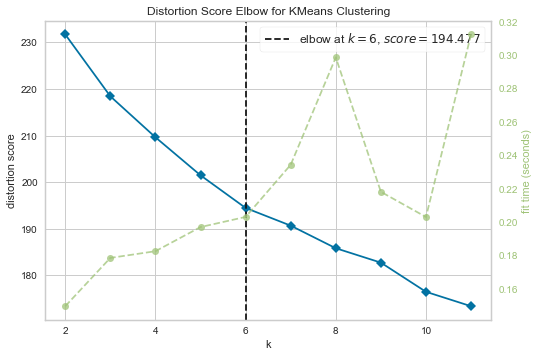

In [99]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer
Casa_grouped_clustering = Casa_grouped.drop('Neighborhood', 1)

model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,12))
visualizer.fit(Casa_grouped_clustering)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [52]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 10

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(Casa_grouped_clustering)
  labels = kmeans.labels_
  sil.append(silhouette_score(Casa_grouped_clustering, labels, metric = 'euclidean'))
sil

[0.1619121718809836,
 0.110358328842894,
 0.08146849635644625,
 0.11311985876108274,
 0.09413170970212356,
 0.08480446200328709,
 0.08606902785941335,
 0.0909038178748387,
 0.11152331522022343]

In [53]:
from sklearn.cluster import KMeans

# set number of clusters
kclusters = 6


# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Casa_grouped_clustering)

In [54]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [55]:
neighborhoods_venues_sorted.head()

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,3,4 EME TRANCHE,Café,Astrologer,Yoga Studio,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
1,2,6 EME TRANCHE,Hotel,Café,Restaurant,Coffee Shop,Plaza,Moroccan Restaurant,Hotel Bar,French Restaurant,Kebab Restaurant,Seafood Restaurant
2,3,AABIR,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
3,1,AAHD AL JADID,Coffee Shop,Moroccan Restaurant,Train Station,Gym,Café,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant
4,0,ABATTOIRES,Bakery,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop


In [56]:
neighborhoods_venues_sorted.set_index('Neighborhood')

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,
4 EME TRANCHE,3,Café,Astrologer,Yoga Studio,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
6 EME TRANCHE,2,Hotel,Café,Restaurant,Coffee Shop,Plaza,Moroccan Restaurant,Hotel Bar,French Restaurant,Kebab Restaurant,Seafood Restaurant
AABIR,3,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AAHD AL JADID,1,Coffee Shop,Moroccan Restaurant,Train Station,Gym,Café,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant
ABATTOIRES,0,Bakery,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
ABOUAB NASSIM,0,Café,Pool Hall,Spa,Flower Shop,Gastropub,Spanish Restaurant,Wings Joint,Coffee Shop,Creperie,Donut Shop
ABOUAB OUM RABII,2,History Museum,Moroccan Restaurant,Antique Shop,Bakery,Juice Bar,BBQ Joint,Café,Yoga Studio,Eastern European Restaurant,Fish & Chips Shop
ABRAJ ABDELMOUMEN,4,Dessert Shop,Shopping Mall,Antique Shop,BBQ Joint,Juice Bar,Yoga Studio,Duty-free Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market
ABRAJ EL FIDA,0,Café,Plaza,Department Store,Eastern European Restaurant,Yoga Studio,Donut Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant


In [57]:
neighborhoods_venues_sorted.shape

(971, 12)

In [58]:
neighborhoods_venues_sorted.dropna(subset=['Cluster Labels'],inplace=True)

In [59]:
neighborhoods_venues_sorted.shape

(971, 12)

In [60]:
Casablanca_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3048 entries, 0 to 0
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   neighborhood  3048 non-null   object
 1   postalcode    3048 non-null   object
 2   Latitude      3048 non-null   object
 3   Longitude     3048 non-null   object
dtypes: object(4)
memory usage: 119.1+ KB


In [61]:
Casablanca_df = Casablanca_df.rename(columns={"neighborhood": "Neighborhood"})

In [62]:
Casa_merged = Casablanca_df
Casa_merged.set_index('Neighborhood')
Casa_merged.head()

,Neighborhood,postalcode,Latitude,Longitude
0,4 EME TRANCHE,20450,33.5566,-7.58045
1,6 EME TRANCHE,20450,33.5966,-7.61889
2,AABIR,20400,33.5523,-7.57931
3,AAHD AL JADID,20450,33.5695,-7.62451
4,ABATTOIRES,20320,33.5942,-7.55473


In [63]:
Casa_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3048 entries, 0 to 0
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Neighborhood  3048 non-null   object
 1   postalcode    3048 non-null   object
 2   Latitude      3048 non-null   object
 3   Longitude     3048 non-null   object
dtypes: object(4)
memory usage: 119.1+ KB


In [64]:
# merge the 2 dataframes add latitude/longitude for each neighborhood
Casa_merged = pd.merge(Casa_merged,neighborhoods_venues_sorted, on='Neighborhood')

Casa_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 971 entries, 0 to 970
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Neighborhood            971 non-null    object
 1   postalcode              971 non-null    object
 2   Latitude                971 non-null    object
 3   Longitude               971 non-null    object
 4   Cluster Labels          971 non-null    int32 
 5   1st Most Common Venue   971 non-null    object
 6   2nd Most Common Venue   971 non-null    object
 7   3rd Most Common Venue   971 non-null    object
 8   4th Most Common Venue   971 non-null    object
 9   5th Most Common Venue   971 non-null    object
 10  6th Most Common Venue   971 non-null    object
 11  7th Most Common Venue   971 non-null    object
 12  8th Most Common Venue   971 non-null    object
 13  9th Most Common Venue   971 non-null    object
 14  10th Most Common Venue  971 non-null    object
dtypes: int

In [65]:
Casa_merged = Casa_merged.drop_duplicates()
Casa_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 971 entries, 0 to 970
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Neighborhood            971 non-null    object
 1   postalcode              971 non-null    object
 2   Latitude                971 non-null    object
 3   Longitude               971 non-null    object
 4   Cluster Labels          971 non-null    int32 
 5   1st Most Common Venue   971 non-null    object
 6   2nd Most Common Venue   971 non-null    object
 7   3rd Most Common Venue   971 non-null    object
 8   4th Most Common Venue   971 non-null    object
 9   5th Most Common Venue   971 non-null    object
 10  6th Most Common Venue   971 non-null    object
 11  7th Most Common Venue   971 non-null    object
 12  8th Most Common Venue   971 non-null    object
 13  9th Most Common Venue   971 non-null    object
 14  10th Most Common Venue  971 non-null    object
dtypes: int

In [66]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors


# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Casa_merged['Latitude'], Casa_merged['Longitude'], Casa_merged['Neighborhood'], Casa_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=1,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## 5. Examine Clusters

In [67]:
Casa_merged = Casa_merged.set_index('Neighborhood')
Casa_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 971 entries, 4 EME TRANCHE to QUARTIER ZOUBIR
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   postalcode              971 non-null    object
 1   Latitude                971 non-null    object
 2   Longitude               971 non-null    object
 3   Cluster Labels          971 non-null    int32 
 4   1st Most Common Venue   971 non-null    object
 5   2nd Most Common Venue   971 non-null    object
 6   3rd Most Common Venue   971 non-null    object
 7   4th Most Common Venue   971 non-null    object
 8   5th Most Common Venue   971 non-null    object
 9   6th Most Common Venue   971 non-null    object
 10  7th Most Common Venue   971 non-null    object
 11  8th Most Common Venue   971 non-null    object
 12  9th Most Common Venue   971 non-null    object
 13  10th Most Common Venue  971 non-null    object
dtypes: int32(1), object(13)
memory usage: 1

In [68]:
Cluster0 = Casa_merged['Cluster Labels'] == 0
Cluster_0 = Casa_merged[Cluster0]
Cluster_0

,postalcode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,,,,
ABATTOIRES,20320,33.5942,-7.55473,0,Bakery,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
ABOUAB NASSIM,20190,33.5838,-7.61464,0,Café,Pool Hall,Spa,Flower Shop,Gastropub,Spanish Restaurant,Wings Joint,Coffee Shop,Creperie,Donut Shop
ABRAJ EL FIDA,20530,33.5381,-7.60318,0,Café,Plaza,Department Store,Eastern European Restaurant,Yoga Studio,Donut Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant
AL AZHAR,20620,33.6215,-7.48586,0,Café,Coffee Shop,Fast Food Restaurant,Fried Chicken Joint,Breakfast Spot,Yoga Studio,Duty-free Shop,Fish & Chips Shop,Farmers Market,Falafel Restaurant
AL BOUSTANE 8,20440,33.5725,-7.55274,0,Recreation Center,Spa,Café,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store
AL IDAA,20480,33.5751,-7.6486,0,Café,Fried Chicken Joint,Juice Bar,Coffee Shop,Sushi Restaurant,Sandwich Place,Snack Place,Martial Arts School,Grocery Store,Restaurant
AL KHOUZAMA 9,20260,33.5586,-7.53263,0,Café,Coffee Shop,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AL MANSOURIA 2,20610,33.5862,-7.54793,0,Circus,Café,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ALSACE LORRAINE,20120,33.6085,-7.51358,0,Café,Farmers Market,Pizza Place,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant


In [69]:
Cluster_0.shape

(216, 14)

In [70]:
Cluster_0['1st Most Common Venue'].value_counts(normalize=True)

Café                    0.745370
Zoo Exhibit             0.037037
Fast Food Restaurant    0.023148
Circus                  0.018519
Convenience Store       0.018519
Tram Station            0.013889
Food Court              0.013889
Bakery                  0.013889
Tailor Shop             0.009259
Ice Cream Shop          0.009259
Spa                     0.009259
Department Store        0.009259
Steakhouse              0.009259
Restaurant              0.004630
Hotel                   0.004630
Bar                     0.004630
Tapas Restaurant        0.004630
Flea Market             0.004630
Hot Dog Joint           0.004630
Sandwich Place          0.004630
Surf Spot               0.004630
Recreation Center       0.004630
Sports Bar              0.004630
Concert Hall            0.004630
Seafood Restaurant      0.004630
Pizza Place             0.004630
Beer Garden             0.004630
Hostel                  0.004630
Name: 1st Most Common Venue, dtype: float64

In [71]:
Cluster_0['2nd Most Common Venue'].value_counts(normalize=True)

Coffee Shop              0.180556
Café                     0.162037
Fast Food Restaurant     0.074074
Hotel                    0.032407
Tram Station             0.032407
Restaurant               0.032407
Pool Hall                0.027778
Big Box Store            0.027778
Bus Station              0.023148
Diner                    0.018519
Concert Hall             0.018519
Mobile Phone Shop        0.018519
Resort                   0.013889
Plaza                    0.013889
Sports Club              0.013889
Pizza Place              0.013889
Zoo Exhibit              0.013889
Soccer Field             0.013889
Convenience Store        0.013889
Martial Arts School      0.009259
Burger Joint             0.009259
Fish & Chips Shop        0.009259
Rental Car Location      0.009259
Japanese Restaurant      0.009259
Athletics & Sports       0.009259
Fried Chicken Joint      0.009259
Farmers Market           0.009259
Steakhouse               0.009259
History Museum           0.009259
BBQ Joint     

In [72]:
Cluster_0['3rd Most Common Venue'].value_counts(normalize=True)

Yoga Studio             0.129630
Café                    0.092593
Coffee Shop             0.074074
Fast Food Restaurant    0.069444
Diner                   0.050926
Donut Shop              0.041667
Spanish Restaurant      0.041667
Pizza Place             0.041667
Spa                     0.032407
Art Gallery             0.032407
BBQ Joint               0.027778
Hotel                   0.027778
Soccer Field            0.023148
Italian Restaurant      0.018519
Department Store        0.018519
Tram Station            0.018519
Moroccan Restaurant     0.018519
Pool Hall               0.018519
Bakery                  0.013889
Breakfast Spot          0.013889
Steakhouse              0.013889
Pharmacy                0.013889
Sushi Restaurant        0.013889
Ice Cream Shop          0.009259
Smoke Shop              0.009259
Juice Bar               0.009259
Plaza                   0.009259
Sandwich Place          0.009259
Bistro                  0.009259
Snack Place             0.009259
Mobile Pho

In [73]:
Cluster1 = Casa_merged['Cluster Labels'] == 1
Cluster_1 = Casa_merged[Cluster1]
Cluster_1

,postalcode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,,,,
AAHD AL JADID,20450,33.5695,-7.62451,1,Coffee Shop,Moroccan Restaurant,Train Station,Gym,Café,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant
ADDAMANE,20460,33.5931,-7.66055,1,Concert Hall,Coffee Shop,Café,Park,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
AHL LOGHLAM,29640,33.5905,-7.58682,1,Coffee Shop,Pizza Place,Bakery,Tourist Information Center,Café,Yoga Studio,Donut Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market
AIN CHIFA 3,20540,33.5426,-7.58694,1,Coffee Shop,Seafood Restaurant,Pizza Place,Café,Yoga Studio,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AMAL 3,20600,33.6044,-7.51126,1,Coffee Shop,Café,Shopping Mall,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ANASSI 10,20630,33.59,-7.49881,1,Zoo Exhibit,Coffee Shop,Pizza Place,Tram Station,Café,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
ANASSI 11,20630,33.5912,-7.49558,1,Zoo Exhibit,Coffee Shop,Café,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ANASSI 12,20630,33.5914,-7.49634,1,Zoo Exhibit,Coffee Shop,Café,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ANASSI 13,20630,33.5909,-7.49727,1,Zoo Exhibit,Coffee Shop,Café,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant


In [74]:
Cluster_1.shape

(121, 14)

In [75]:
Cluster_1['1st Most Common Venue'].value_counts(normalize=True)

Coffee Shop             0.611570
Zoo Exhibit             0.181818
Convenience Store       0.041322
Athletics & Sports      0.024793
Racetrack               0.016529
Concert Hall            0.016529
Fast Food Restaurant    0.016529
Café                    0.016529
Theater                 0.016529
Burrito Place           0.008264
Flea Market             0.008264
Recreation Center       0.008264
Accessories Store       0.008264
Comedy Club             0.008264
Bus Station             0.008264
Hotel                   0.008264
Name: 1st Most Common Venue, dtype: float64

In [76]:
Cluster_1['2nd Most Common Venue'].value_counts(normalize=True)

Coffee Shop             0.347107
Fast Food Restaurant    0.099174
Café                    0.099174
Snack Place             0.049587
Moroccan Restaurant     0.041322
Pizza Place             0.033058
Athletics & Sports      0.033058
Wings Joint             0.024793
Tram Station            0.024793
Restaurant              0.024793
Train Station           0.016529
Dog Run                 0.016529
Soccer Field            0.016529
Yoga Studio             0.016529
Grocery Store           0.016529
Gym                     0.008264
Historic Site           0.008264
Market                  0.008264
IT Services             0.008264
Cruise Ship             0.008264
Beach                   0.008264
Camera Store            0.008264
Spa                     0.008264
History Museum          0.008264
Pharmacy                0.008264
Plaza                   0.008264
Boarding House          0.008264
Seafood Restaurant      0.008264
Shopping Mall           0.008264
Turkish Restaurant      0.008264
Beer Garde

In [77]:
Cluster_1['3rd Most Common Venue'].value_counts(normalize=True)

Café                    0.239669
Yoga Studio             0.099174
Pizza Place             0.099174
Shopping Mall           0.074380
Restaurant              0.066116
Bakery                  0.057851
Fast Food Restaurant    0.041322
Grocery Store           0.041322
Pharmacy                0.033058
Train Station           0.024793
Fish Market             0.024793
Clothing Store          0.024793
Camera Store            0.016529
Donut Shop              0.016529
Gym                     0.016529
Music Venue             0.008264
Golf Course             0.008264
Water Park              0.008264
Market                  0.008264
Burger Joint            0.008264
Martial Arts School     0.008264
Ethiopian Restaurant    0.008264
Soccer Stadium          0.008264
Spa                     0.008264
Boutique                0.008264
Tram Station            0.008264
Moroccan Restaurant     0.008264
Soccer Field            0.008264
Cupcake Shop            0.008264
Coffee Shop             0.008264
Name: 3rd 

In [78]:
Cluster2 = Casa_merged['Cluster Labels'] == 2
Cluster_2 = Casa_merged[Cluster2]
Cluster_2

,postalcode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,,,,
6 EME TRANCHE,20450,33.5966,-7.61889,2,Hotel,Café,Restaurant,Coffee Shop,Plaza,Moroccan Restaurant,Hotel Bar,French Restaurant,Kebab Restaurant,Seafood Restaurant
ABOUAB OUM RABII,20220,33.5782,-7.60302,2,History Museum,Moroccan Restaurant,Antique Shop,Bakery,Juice Bar,BBQ Joint,Café,Yoga Studio,Eastern European Restaurant,Fish & Chips Shop
AEROPORT MOHAMED V,29002,33.3722,-7.57953,2,Airport Lounge,Airport Terminal,Bistro,Sandwich Place,Flea Market,Airport Service,Duty-free Shop,Coffee Shop,Mobile Phone Shop,Border Crossing
AIN BORJA,20320,33.5727,-7.66396,2,Miscellaneous Shop,Accessories Store,Cosmetics Shop,Chinese Restaurant,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant
AIN CHIFA 1,20540,33.5727,-7.6638,2,Miscellaneous Shop,Accessories Store,Cosmetics Shop,Chinese Restaurant,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant
AIN CHIFA 2,20540,33.5734,-7.66457,2,Sports Club,Miscellaneous Shop,Moroccan Restaurant,Tram Station,Yoga Studio,Donut Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
AIN CHOK,20470,33.5839,-7.69111,2,Beach Bar,Pool,Music Venue,African Restaurant,Sports Club,Surf Spot,Theme Park,Fast Food Restaurant,Farmers Market,Falafel Restaurant
AIN DIAB,20180,33.4928,-7.54564,2,Pier,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store
AIN HALOUF,27182,33.5905,-7.64069,2,Café,Italian Restaurant,Pub,Coffee Shop,Steakhouse,Japanese Restaurant,Karaoke Bar,Food,Latin American Restaurant,Mexican Restaurant


In [79]:
Cluster_2.shape

(463, 14)

In [80]:
Cluster_2['1st Most Common Venue'].value_counts(normalize=True)

Café                         0.241901
Fast Food Restaurant         0.112311
Hotel                        0.060475
Convenience Store            0.034557
Moroccan Restaurant          0.030238
Pizza Place                  0.028078
Sports Club                  0.028078
Seafood Restaurant           0.021598
Flea Market                  0.021598
Coffee Shop                  0.019438
Diner                        0.019438
Bus Station                  0.017279
Restaurant                   0.017279
Farmers Market               0.015119
Beach                        0.015119
Surf Spot                    0.012959
Bakery                       0.012959
Plaza                        0.012959
Furniture / Home Store       0.012959
Sandwich Place               0.010799
Steakhouse                   0.010799
Spa                          0.010799
Spanish Restaurant           0.008639
Movie Theater                0.008639
Boutique                     0.008639
Athletics & Sports           0.008639
Public Art  

In [81]:
Cluster_2['2nd Most Common Venue'].value_counts(normalize=True)

Yoga Studio                0.107991
Fast Food Restaurant       0.088553
Hotel                      0.073434
Café                       0.051836
Restaurant                 0.041037
Coffee Shop                0.034557
Moroccan Restaurant        0.032397
Pizza Place                0.032397
Electronics Store          0.025918
Pub                        0.025918
Bakery                     0.023758
Department Store           0.023758
Italian Restaurant         0.023758
Diner                      0.021598
Pool Hall                  0.021598
Farmers Market             0.017279
Snack Place                0.015119
Tram Station               0.012959
Carpet Store               0.012959
Supermarket                0.012959
History Museum             0.012959
Spa                        0.010799
Athletics & Sports         0.010799
Salon / Barbershop         0.010799
Plaza                      0.010799
Lounge                     0.008639
Beach                      0.008639
Spanish Restaurant         0

In [82]:
Cluster_2['3rd Most Common Venue'].value_counts(normalize=True)

Café                         0.053996
Pizza Place                  0.045356
Bakery                       0.041037
Italian Restaurant           0.038877
Moroccan Restaurant          0.036717
Diner                        0.036717
Yoga Studio                  0.034557
Fast Food Restaurant         0.034557
Restaurant                   0.032397
Coffee Shop                  0.028078
Hotel                        0.028078
Sandwich Place               0.025918
Flea Market                  0.023758
Juice Bar                    0.023758
Dessert Shop                 0.021598
Gym                          0.021598
French Restaurant            0.019438
Doner Restaurant             0.019438
Tram Station                 0.019438
Japanese Restaurant          0.017279
Fish Market                  0.017279
Snack Place                  0.017279
Donut Shop                   0.017279
Comfort Food Restaurant      0.015119
Flower Shop                  0.015119
Department Store             0.015119
Sushi Restau

In [83]:
Cluster3 = Casa_merged['Cluster Labels'] == 3
Cluster_3 = Casa_merged[Cluster3]
Cluster_3

,postalcode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,,,,
4 EME TRANCHE,20450,33.5566,-7.58045,3,Café,Astrologer,Yoga Studio,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AABIR,20400,33.5523,-7.57931,3,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AL BAIDA 1,20630,33.5508,-7.58042,3,Café,Martial Arts School,Yoga Studio,Donut Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AL FAJR 2,20620,33.5818,-7.55426,3,Café,Art Gallery,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
AL MOUAHIDINE,20570,33.583,-7.55503,3,Café,Botanical Garden,Yoga Studio,Donut Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
AMAL 4,20600,33.5688,-7.54351,3,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ANAIM 2,20260,33.5929,-7.49657,3,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ANASSI 1A,20630,33.5926,-7.49647,3,Café,Zoo Exhibit,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ANASSI 32,20640,33.5906,-7.49148,3,Café,Yoga Studio,Donut Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant


In [84]:
Cluster_3.shape

(76, 14)

In [85]:
Cluster_3['1st Most Common Venue'].value_counts(normalize=True)

Café    1.0
Name: 1st Most Common Venue, dtype: float64

In [86]:
Cluster_3['2nd Most Common Venue'].value_counts(normalize=True)

Yoga Studio             0.513158
Ice Cream Shop          0.065789
Bistro                  0.052632
Asian Restaurant        0.039474
Bakery                  0.039474
Martial Arts School     0.026316
Breakfast Spot          0.026316
Coffee Shop             0.026316
Athletics & Sports      0.013158
Juice Bar               0.013158
Pharmacy                0.013158
Art Gallery             0.013158
Big Box Store           0.013158
Pool Hall               0.013158
Steakhouse              0.013158
Zoo Exhibit             0.013158
Astrologer              0.013158
Convenience Store       0.013158
Garden Center           0.013158
Gym / Fitness Center    0.013158
Tailor Shop             0.013158
Pier                    0.013158
Restaurant              0.013158
Botanical Garden        0.013158
Name: 2nd Most Common Venue, dtype: float64

In [87]:
Cluster_3['3rd Most Common Venue'].value_counts(normalize=True)

Donut Shop           0.592105
Yoga Studio          0.328947
Doner Restaurant     0.039474
Ice Cream Shop       0.013158
Mobile Phone Shop    0.013158
BBQ Joint            0.013158
Name: 3rd Most Common Venue, dtype: float64

In [88]:
Cluster4 = Casa_merged['Cluster Labels'] == 4
Cluster_4 = Casa_merged[Cluster4]
Cluster_4

,postalcode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,,,,
ABRAJ ABDELMOUMEN,20340,33.5763,-7.59954,4,Dessert Shop,Shopping Mall,Antique Shop,BBQ Joint,Juice Bar,Yoga Studio,Duty-free Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market
AMAL 1,20600,33.5729,-7.59154,4,Shopping Mall,Café,Pool Hall,Coffee Shop,Playground,Juice Bar,Burger Joint,Doner Restaurant,Farmers Market,Falafel Restaurant
AMANA,20620,33.5439,-7.68335,4,Restaurant,Snack Place,Italian Restaurant,Shopping Mall,Juice Bar,Yoga Studio,Doner Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
BLOC MOUKAOUIMOUNE,20560,33.5893,-7.59216,4,Fast Food Restaurant,Plaza,Shopping Mall,Yoga Studio,Doner Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store
CITE BEL AIR,20570,33.5855,-7.59133,4,Fast Food Restaurant,Shopping Mall,Plaza,Supermarket,Taco Place,Yoga Studio,Donut Shop,Farmers Market,Falafel Restaurant,Fabric Shop
CITE SEVAM,20580,33.5716,-7.68987,4,Café,Shopping Mall,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store
DAR EL MILOUDI,20020,33.5992,-7.63868,4,Middle Eastern Restaurant,Pizza Place,Shopping Mall,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
DERB AL ALAMI,20490,33.5387,-7.68497,4,Shopping Mall,Yoga Studio,Comfort Food Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store
DERB AL JAZOULI,20510,33.5762,-7.59367,4,Shopping Mall,Playground,Yoga Studio,Doner Restaurant,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store


In [89]:
Cluster_4.shape

(54, 14)

In [90]:
Cluster_4['1st Most Common Venue'].value_counts(normalize=True)

Shopping Mall                0.277778
Snack Place                  0.129630
Café                         0.111111
Coffee Shop                  0.074074
Middle Eastern Restaurant    0.074074
Fast Food Restaurant         0.074074
Grocery Store                0.055556
Moroccan Restaurant          0.037037
Fish & Chips Shop            0.037037
Sandwich Place               0.037037
Dessert Shop                 0.018519
Restaurant                   0.018519
BBQ Joint                    0.018519
Comedy Club                  0.018519
Hotel                        0.018519
Name: 1st Most Common Venue, dtype: float64

In [91]:
Cluster_4['2nd Most Common Venue'].value_counts(normalize=True)

Shopping Mall           0.351852
Yoga Studio             0.111111
Pool Hall               0.111111
Snack Place             0.055556
Juice Bar               0.055556
Fast Food Restaurant    0.055556
Plaza                   0.037037
Pizza Place             0.037037
Comedy Club             0.037037
Café                    0.037037
BBQ Joint               0.037037
Dessert Shop            0.018519
Playground              0.018519
Grocery Store           0.018519
Hotel                   0.018519
Name: 2nd Most Common Venue, dtype: float64

In [92]:
Cluster_4['3rd Most Common Venue'].value_counts(normalize=True)

Shopping Mall              0.240741
Yoga Studio                0.203704
Comfort Food Restaurant    0.111111
Grocery Store              0.092593
Antique Shop               0.055556
Pool Hall                  0.055556
Plaza                      0.037037
Playground                 0.037037
Moroccan Restaurant        0.037037
Café                       0.037037
Coffee Shop                0.018519
Performing Arts Venue      0.018519
Italian Restaurant         0.018519
Juice Bar                  0.018519
Beach                      0.018519
Name: 3rd Most Common Venue, dtype: float64

In [93]:
Cluster5 = Casa_merged['Cluster Labels'] == 5
Cluster_5 = Casa_merged[Cluster5]
Cluster_5

,postalcode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
Neighborhood,,,,,,,,,,,,,,
AL QODS C,20610,33.5726,-7.51679,5,Coffee Shop,Tram Station,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
ASSIL,20560,33.574,-7.52457,5,Tram Station,Auto Garage,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
BEAUSSITE,20250,33.593,-7.571,5,Tram Station,Pizza Place,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
BLOC HOFRA KHLIFA CD,20430,33.5866,-7.56331,5,Soccer Field,Tram Station,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
BLOC PANORAMA 4,20620,33.5929,-7.56925,5,Tram Station,Pizza Place,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
CITE CHNEIDER,20370,33.5941,-7.56972,5,Pizza Place,Tram Station,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant
CITE OUALILI,20230,33.5908,-7.57767,5,Tram Station,Coffee Shop,Pharmacy,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
CITE PARK,20070,33.5723,-7.63236,5,Tram Station,Flea Market,Gym,Café,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop
DERB AL KARMA,20010,33.5771,-7.56341,5,Tram Station,Yoga Studio,Doner Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant,Fabric Shop,Ethiopian Restaurant,Electronics Store


In [94]:
Cluster_5.shape

(41, 14)

In [95]:
Cluster_5['1st Most Common Venue'].value_counts(normalize=True)

Tram Station     0.463415
Coffee Shop      0.317073
Hot Dog Joint    0.121951
Soccer Field     0.024390
Bar              0.024390
Concert Hall     0.024390
Pizza Place      0.024390
Name: 1st Most Common Venue, dtype: float64

In [96]:
Cluster_5['2nd Most Common Venue'].value_counts(normalize=True)

Coffee Shop            0.317073
Tram Station           0.243902
Pizza Place            0.121951
Bar                    0.097561
Yoga Studio            0.073171
Moroccan Restaurant    0.024390
Gas Station            0.024390
Convenience Store      0.024390
Flea Market            0.024390
Hot Dog Joint          0.024390
Auto Garage            0.024390
Name: 2nd Most Common Venue, dtype: float64

In [97]:
Cluster_5['3rd Most Common Venue'].value_counts(normalize=True)

Tram Station             0.292683
Yoga Studio              0.195122
Pharmacy                 0.097561
Doner Restaurant         0.073171
Gym                      0.048780
Performing Arts Venue    0.048780
Auto Garage              0.024390
Coffee Shop              0.024390
Spa                      0.024390
Art Gallery              0.024390
Dog Run                  0.024390
Pizza Place              0.024390
Train Station            0.024390
Moroccan Restaurant      0.024390
Gas Station              0.024390
Theme Park               0.024390
Name: 3rd Most Common Venue, dtype: float64